# An Improved VAE

## Table of Contents
1. [Data and Model Definitions](Data-and-Model-Definitions)
2. [Basic Model Analysis](#Basic-Model-Analysis)
3. [Training with New Genres](#Training-with-New-Genres)
4. [Training at Scale](#Training-at-Scale)

In [1]:
import librosa, os #audio processing and file system parsing
import librosa.display
import numpy as np #math library
import tensorflow as tf #for model building
from tensorflow.keras import Model
from tensorflow.keras.layers import Input, Dense, Lambda, Reshape, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt # for visualization
import pandas as pd #for data analysis / prep
import IPython.display as ipd #for sound output
from scipy.spatial.distance import cosine

## Data and Model Definitions

In this section we define our core data processing techniques and VAE model structure. Our data processing techniques are a huge improvement from `notebooks/simple_vae.ipynb` because we unnormalize our samples and also pad/truncate the audio data.

In [2]:
# Define hop_length (adjust as needed)
HOP_LENGTH = 512
TIME_FRAMES = 1290

def load_data(audio_dir: str, n_mels: int=128, time_frames: int=216):
    """Processes a directory of audio files into a DataFrame which contains the ground truth audio, ground truth spectrogram, and normalization parameters min_max for each song."""
    audio_files = os.listdir(audio_dir)
    audio_data = {'filename': [], 'gt_audio': [], 'gt_spectrogram': [], 'min_max': []}

    for file in audio_files:
        try:
            original_audio, sampling_rate = librosa.load(os.path.join(audio_dir, file), sr=None)  # Preserve original sampling rate

            mel_spectrogram = librosa.feature.melspectrogram(y=original_audio, sr=sampling_rate, n_mels=n_mels, hop_length=HOP_LENGTH)
            S_dB = librosa.power_to_db(mel_spectrogram, ref=np.max)  # Normalize based on max power
            
            # Save min/max values for proper denormalization later
            S_dB_min = np.min(S_dB)
            S_dB_max = np.max(S_dB)
            
            # Normalize to [0,1]
            S_dB = (S_dB - S_dB_min) / (S_dB_max - S_dB_min)

            # **Truncate or pad spectrogram to $time frames**
            if S_dB.shape[1] < TIME_FRAMES:
                pad_width = TIME_FRAMES - S_dB.shape[1]
                S_dB = np.pad(S_dB, pad_width=((0, 0), (0, pad_width)), mode='constant')
            elif S_dB.shape[1] > TIME_FRAMES:
                S_dB = S_dB[:, :TIME_FRAMES]
            
            # Store data
            audio_data['filename'].append(file)
            audio_data['gt_audio'].append(original_audio)
            audio_data['gt_spectrogram'].append(S_dB)
            audio_data['min_max'].append((S_dB_min, S_dB_max))  # Save for denormalization
        
        except Exception as e:
            print(f"Skipping file {file} due to error: {e}")
    
    return pd.DataFrame(audio_data)

def reconstruct_audio(spectrogram, sr=22050, n_mels=128, min_max=None):
    """Reconstructs audio from a normalized Mel spectrogram. Utilizes parameters from normalization to reverse process!"""
    spectrogram = np.array(spectrogram)
    S_dB_min, S_dB_max = min_max
    S_dB = spectrogram * (S_dB_max - S_dB_min) + S_dB_min  # Reverse normalization

    # Convert back to power spectrogram (ensure this transformation is correct)
    S = librosa.db_to_power(S_dB)  

    # Convert Mel spectrogram back to waveform
    reconstructed_audio = librosa.feature.inverse.mel_to_audio(S, sr=sr, hop_length=HOP_LENGTH)  
    return reconstructed_audio


In [3]:
jazz_df = load_data("../data/genres_original/jazz/")
jazz_df.head()

C:\Users\kaminfar\AppData\Local\Temp\ipykernel_14492\1707909223.py:12: UserWarning: PySoundFile failed. Trying audioread instead.
  original_audio, sampling_rate = librosa.load(os.path.join(audio_dir, file), sr=None)  # Preserve original sampling rate
C:\Users\kaminfar\AppData\Local\anaconda3\envs\cs757_project\lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Skipping file jazz.00054.wav due to error: 


,filename,gt_audio,gt_spectrogram,min_max
0,jazz.00000.wav,"[-0.009246826, -0.011779785, -0.013702393, -0....","[[0.3865718, 0.47441396, 0.45137018, 0.5116136...","(-80.0, 0.0)"
1,jazz.00001.wav,"[0.0024108887, 0.005493164, 0.008666992, 0.011...","[[0.59155864, 0.52710944, 0.5079421, 0.5584143...","(-80.0, 0.0)"
2,jazz.00002.wav,"[0.0033569336, 0.00491333, 0.0037841797, 0.004...","[[0.43810177, 0.35986775, 0.27125865, 0.293299...","(-80.0, 0.0)"
3,jazz.00003.wav,"[0.029510498, 0.048187256, 0.041900635, 0.0433...","[[0.7292227, 0.6961829, 0.63356054, 0.6362777,...","(-80.0, 0.0)"
4,jazz.00004.wav,"[0.122039795, 0.22442627, 0.19665527, 0.171508...","[[0.5783963, 0.49947515, 0.4212994, 0.38037986...","(-80.0, 0.0)"


In [4]:
def create_vae():
    #let's try an architecture modeled off of this article (https://yuehan-z.medium.com/how-to-train-your-ml-models-music-generation-try-it-out-d4c0ab01c9f4)
    n_mels, time_frames = 128, TIME_FRAMES #audio params
    latent_dim = 32 #dimensionality of VAE
    
    # Encoder
    encoder_input = Input(shape=(n_mels, time_frames))
    encoder_flatten = Flatten()(encoder_input)
    z_mean = Dense(latent_dim)(encoder_flatten)
    z_log_var = Dense(latent_dim)(encoder_flatten)
    
    def sampling(args):
        z_mean, z_log_var = args
        batch = K.shape(z_mean)[0]
        dim = K.int_shape(z_mean)[1]
        epsilon = K.random_normal(shape=(batch, dim))
        return z_mean + K.exp(0.5 * z_log_var) * epsilon

    z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])
    encoder = Model(encoder_input, [z_mean, z_log_var, z], name="encoder")
    
    #Decoder
    decoder_input = Input(shape=(latent_dim,))
    decoder_dense = Dense(n_mels * time_frames, activation="sigmoid")(decoder_input)
    decoder_reshaped = Reshape((n_mels, time_frames))(decoder_dense)
    decoder = Model(decoder_input, decoder_reshaped, name="decoder")
    
    #Loss
    def vae_loss_function(args):
        y_true, y_pred, z_mean, z_log_var = args
        reconstruction_loss = K.mean(K.square(y_true - y_pred))
        kl_loss = -0.5 * K.mean(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var))
        return reconstruction_loss + kl_loss
    
    #Full VAE
    # Create the VAE
    vae_input = Input(shape=(n_mels, time_frames))
    vae_target = Input(shape=(n_mels, time_frames))
    encoder_output = encoder(vae_input)
    decoder_output = decoder(encoder_output[2])
    
    # Add the loss function to the model using a Lambda layer
    loss = Lambda(vae_loss_function, output_shape=(1,), name='loss')([vae_target, decoder_output, encoder_output[0], encoder_output[1]])
    vae = Model(inputs=[vae_input, vae_target], outputs=[decoder_output, loss])

    return vae

In [5]:
#TRAIN VAE

#prep data
len(set(jazz_df['gt_spectrogram'].apply(lambda spec: spec.shape))) == 1 #all specs the same length?
jazz_songs = np.array(jazz_df['gt_spectrogram'].tolist()) #transform song shapes

#hyperparams
batch_size = 10
epochs = 100

# Compile the VAE
vae = create_vae()
vae.compile(optimizer=Adam(learning_rate=0.001), loss=['mse', None])

# Train the VAE
history = vae.fit([jazz_songs,jazz_songs], [jazz_songs,np.zeros_like(jazz_songs)],
                  epochs=epochs,
                  batch_size=batch_size)

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - loss: 0.0604
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 187ms/step - loss: 0.0235
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 189ms/step - loss: 0.0235
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 215ms/step - loss: 0.0213
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.0188
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step - loss: 0.0168
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step - loss: 0.0168
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 189ms/step - loss: 0.0149
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 182ms/step - loss: 0.0147
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.0165
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 185ms/step - loss: 0.0163
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - loss: 0.0144
Epoch 13/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 0.0140
Epoch 14/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 184ms/step - loss: 0.0133
Epoch 15/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 

## Basic Model Analysis

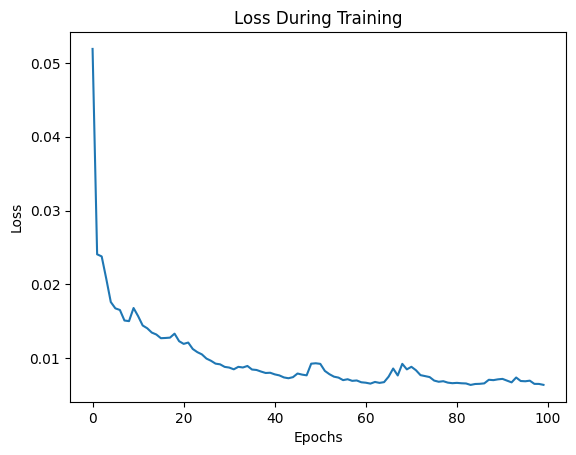

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step 


,filename,gt_audio,gt_spectrogram,min_max,pred_spectrogram
0,jazz.00000.wav,"[-0.009246826, -0.011779785, -0.013702393, -0....","[[0.3865718, 0.47441396, 0.45137018, 0.5116136...","(-80.0, 0.0)","[[0.3900159001350403, 0.46731626987457275, 0.4..."
1,jazz.00001.wav,"[0.0024108887, 0.005493164, 0.008666992, 0.011...","[[0.59155864, 0.52710944, 0.5079421, 0.5584143...","(-80.0, 0.0)","[[0.5960085988044739, 0.5953367948532104, 0.61..."
2,jazz.00002.wav,"[0.0033569336, 0.00491333, 0.0037841797, 0.004...","[[0.43810177, 0.35986775, 0.27125865, 0.293299...","(-80.0, 0.0)","[[0.3586697578430176, 0.3102199137210846, 0.27..."
3,jazz.00003.wav,"[0.029510498, 0.048187256, 0.041900635, 0.0433...","[[0.7292227, 0.6961829, 0.63356054, 0.6362777,...","(-80.0, 0.0)","[[0.6179190874099731, 0.588384747505188, 0.567..."
4,jazz.00004.wav,"[0.122039795, 0.22442627, 0.19665527, 0.171508...","[[0.5783963, 0.49947515, 0.4212994, 0.38037986...","(-80.0, 0.0)","[[0.5548125505447388, 0.5228515863418579, 0.43..."


In [6]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.title('Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

pred_spectrograms, _ = vae.predict([jazz_songs, jazz_songs])
jazz_df['pred_spectrogram'] = pd.Series(pred_spectrograms.tolist())
jazz_df.head()

In [7]:
def compute_cosine_similarity(df: pd.DataFrame, col1: str, col2: str):
    """
    Compute cosine similarity between two spectrogram columns in a DataFrame.

    Args:
        df (pd.DataFrame): DataFrame containing spectrogram data.
        col1 (str): Name of the first column (e.g., ground truth spectrograms).
        col2 (str): Name of the second column (e.g., generated spectrograms).

    Returns:
        np.ndarray: Array of cosine similarities.
    """
    similarities = []
    
    for idx, row in df.iterrows():
        spec1 = np.array(row[col1]).flatten()  # Flatten to 1D
        spec2 = np.array(row[col2]).flatten()  # Flatten to 1D
        
        if spec1.shape != spec2.shape:
            print(f"Warning: Shape mismatch at index {idx} ({spec1.shape} vs {spec2.shape})")
            similarities.append(np.nan)
            continue

        similarities.append(1 - cosine(spec1, spec2))  # Cosine similarity (1 - cosine distance)

    return np.array(similarities)

def compare_song_audios(jazz_df: pd.DataFrame, sample_n: int=0):
    """Convenience function to play a single generated song."""
    pred_audio = reconstruct_audio(jazz_df.iloc[sample_n]['pred_spectrogram'], 22050, 128, jazz_df.iloc[sample_n]['min_max'])
    return ipd.Audio(jazz_df.iloc[sample_n]['gt_audio'], rate=22050),ipd.Audio(pred_audio, rate=22050)

# Visualize the original and reconstructed spectrograms
def plot_spectrogram_comparison(jazz_df: pd.DataFrame, index: int):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Plot the original spectrogram
    axes[0].imshow(jazz_df.iloc[index]['gt_spectrogram'], origin='lower', aspect='auto')
    axes[0].set_title("Original Spectrogram")

    # Plot the reconstructed spectrogram
    axes[1].imshow(jazz_df.iloc[index]['pred_spectrogram'], origin='lower', aspect='auto')
    axes[1].set_title("Reconstructed Spectrogram")

    plt.show()

Cosine Similarity Comparison

In [8]:
jazz_df['cosine_similarity'] = compute_cosine_similarity(jazz_df, 'gt_spectrogram', 'pred_spectrogram')
jazz_df['cosine_similarity'].sort_values()

worst_idx = jazz_df['cosine_similarity'].idxmin()
best_idx = jazz_df['cosine_similarity'].idxmax()

print(f"Worst VAE Reconstruction Index: {worst_idx}")
print(f"Best VAE Reconstruction Index: {best_idx}")


Worst VAE Reconstruction Index: 96
Best VAE Reconstruction Index: 68


Audio Comparison

In [9]:
#worst reconstruction!
real, pred = compare_song_audios(jazz_df, worst_idx)

In [10]:
real

In [11]:
pred

In [12]:
#best reconstruction!
real, pred = compare_song_audios(jazz_df, best_idx)

In [13]:
real

In [14]:
pred

Obviously these results are disappointing, but remember two things:
1) We're not directly learning audio. We're learning spectrograms!
2) Audio>Spectrogram>Audio is an inherently lossy process. If you're not convinced, consider the loss even with a ground truth sample here.

Instead of judging entirely by audio, let's take a look at the spectograms we produced!

In [15]:
sample_n = 80
original_song = jazz_df['gt_audio'][sample_n]
original_audio = ipd.Audio(original_song, rate=22050)
lossy_song = reconstruct_audio(jazz_df['gt_spectrogram'][sample_n], 22050, 128, jazz_df['min_max'][sample_n])
lossy_audio = ipd.Audio(lossy_song, rate=22050) #this sounds HORRIBLE! it is probably the fact that we didn't unnormalize?
print(f"original size: {original_song.shape}\ttransformed size: {lossy_song.shape}")

original size: (661794,)	transformed size: (659968,)


In [16]:
original_audio

In [17]:
lossy_audio

Spectrogram Analysis

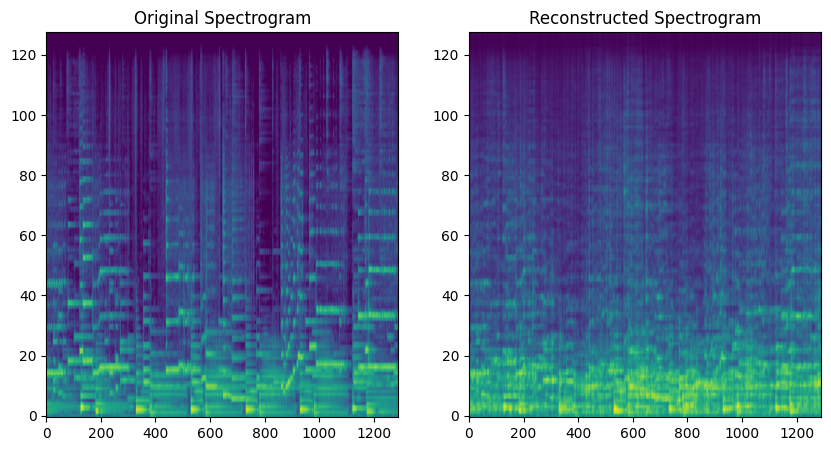

In [18]:
plot_spectrogram_comparison(jazz_df, worst_idx)

This is our worst reconstructed sample by cosine similarity, and it's obvious why! We're missing a ton of notes and things just sort of smear together.

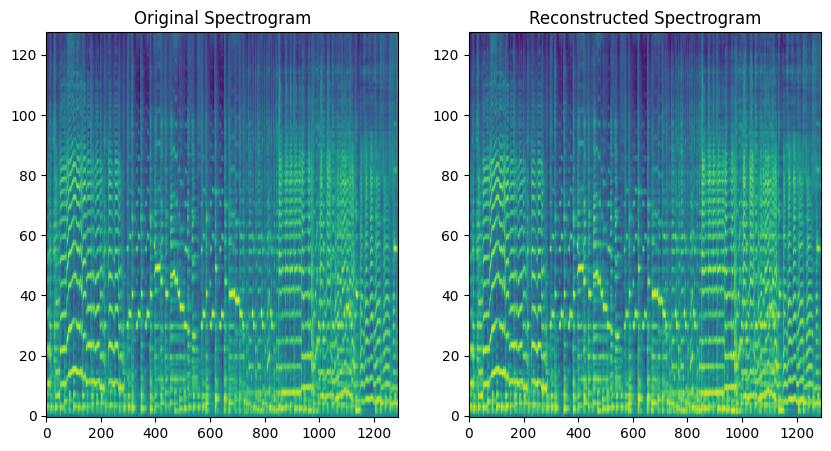

In [19]:
plot_spectrogram_comparison(jazz_df, best_idx)

This is our best one and woah! It's so clear to tell!

## VQ VAE


Here is how we extend the standard VAE by introducing the discrete latent variables (instead of continous ones).

In [ ]:
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Layer
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization

from scipy.spatial.distance import cosine

In [20]:
# # ---- VECTOR QUANTIZER ---- #
# class VectorQuantizer(Layer):
#     """ Implements the vector quantization layer, which maps continuous latent representations
#         to discrete embeddings from a learned codebook. This layer enables discrete latent learning.
#     """
#     def __init__(self, num_embeddings, embedding_dim, beta, **kwargs):
#         super().__init__(**kwargs)
#         self.embedding_dim = embedding_dim
#         self.num_embeddings = num_embeddings
#         self.beta = beta  # Commitment cost to ensure latent representations remain close to embeddings

#         # Initialize the embedding codebook with uniform distribution
#         w_init = tf.random_uniform_initializer()
#         self.embeddings = tf.Variable(
#             initial_value=w_init(
#                 shape=(self.embedding_dim, self.num_embeddings), dtype="float32"
#             ),
#             trainable=True,
#             name="embeddings_vqvae",
#         )


#     def call(self, x):
#         """ Performs vector quantization by mapping continuous inputs to their closest embeddings. """
#         input_shape = tf.shape(x)
#         flattened = tf.reshape(x, [-1, self.embedding_dim])  # Flatten input to match embedding dimension

#         # Compute nearest embedding index
#         encoding_indices = self.get_code_indices(flattened)
#         encodings = tf.one_hot(encoding_indices, self.num_embeddings)  # Convert to one-hot representation
#         quantized = tf.matmul(encodings, self.embeddings, transpose_b=True)  # Retrieve nearest embeddings

#         # Reshape quantized values to match input shape
#         quantized = tf.reshape(quantized, input_shape)

#         # Compute vector quantization loss (encouraging commitment to embeddings)
#         commitment_loss = tf.reduce_mean((tf.stop_gradient(quantized) - x) ** 2)
#         codebook_loss = tf.reduce_mean((quantized - tf.stop_gradient(x)) ** 2)
#         self.add_loss(self.beta * commitment_loss + codebook_loss)

#         # Straight-through estimator: Pass gradients through quantized values
#         quantized = x + tf.stop_gradient(quantized - x)
#         return quantized

#     def get_code_indices(self, flattened_inputs):
#         """ Computes distances between input features and embedding vectors to find closest match. """
#         similarity = tf.matmul(flattened_inputs, self.embeddings)
#         distances = (
#             tf.reduce_sum(flattened_inputs ** 2, axis=1, keepdims=True)
#             + tf.reduce_sum(self.embeddings ** 2, axis=0)
#             - 2 * similarity
#         )
        

#         # Identify nearest embedding indices based on minimal distance
#         encoding_indices = tf.argmin(distances, axis=1)
#         return encoding_indices
        

# # ---- MODEL CREATION ---- #


# from tensorflow.keras.layers import LayerNormalization

# def get_encoder(latent_dim):
#     """ Defines the encoder network that compresses the input spectrogram into a lower-dimensional latent space. """
#     encoder_inputs = keras.Input(shape=(128, 1290, 1))  
#     x = layers.Conv2D(32, (3, 3), activation="relu", strides=(2, 2), padding="same")(encoder_inputs)
#     x = LayerNormalization()(x)  # Layer Norm instead of Batch Norm
#     x = layers.Conv2D(64, (3, 3), activation="relu", strides=(2, 2), padding="same")(x)
#     x = LayerNormalization()(x)
#     x = layers.Conv2D(128, (3, 3), activation="relu", strides=(2, 2), padding="same")(x)
#     x = LayerNormalization()(x)
#     encoder_outputs = layers.Conv2D(latent_dim, (1, 1), padding="same")(x)
#     return keras.Model(encoder_inputs, encoder_outputs, name="encoder")



# def get_decoder(latent_dim):
#     """ Defines the decoder network that reconstructs the input from the quantized latent representation. """
#     latent_inputs = keras.Input(shape=get_encoder(latent_dim).output.shape[1:])  # Input shape from encoder output
#     x = layers.Conv2DTranspose(128, (3, 3), activation="relu", strides=(2, 2), padding="same")(latent_inputs)
#     x = layers.Conv2DTranspose(64, (3, 3), activation="relu", strides=(2, 2), padding="same")(x)
#     x = layers.Conv2DTranspose(32, (3, 3), activation="relu", strides=(2, 2), padding="same")(x)
#     x = layers.Conv2DTranspose(1, (3, 3), padding="same")(x)  # Output single-channel reconstructed spectrogram
#     x = layers.Cropping2D(cropping=((0, 0), (3, 3)))(x)  # Crop to match (128, 1290, 1)
#     return keras.Model(latent_inputs, x, name="decoder")


# def get_vqvae(latent_dim, num_embeddings, beta):
#     """ Assembles the VQ-VAE model by integrating the encoder, vector quantizer, and decoder. """
#     vq_layer = VectorQuantizer(num_embeddings, latent_dim, beta, name="vector_quantizer")
#     encoder = get_encoder(latent_dim)
#     decoder = get_decoder(latent_dim)
    
#     inputs = keras.Input(shape=(128, 1290, 1))  # Spectrogram input
#     encoder_outputs = encoder(inputs)  # Compress input into latent space
#     quantized_latents = vq_layer(encoder_outputs)  # Discretize latent representations
#     reconstructions = decoder(quantized_latents)  # Reconstruct spectrogram

#     return keras.Model(inputs, reconstructions, name="vq_vae")

# class VQVAETrainer(keras.models.Model):
#     """ Custom training loop for VQ-VAE to compute losses and update embeddings. """
#     def __init__(self, train_variance, latent_dim, num_embeddings, beta, **kwargs):
#         super().__init__(**kwargs)
#         self.train_variance = train_variance  # Variance of training data (used for normalization)
#         self.latent_dim = latent_dim
#         self.num_embeddings = num_embeddings

#         # Initialize the VQ-VAE model
#         self.vqvae = get_vqvae(self.latent_dim, self.num_embeddings, beta)

#         # Track loss components during training
#         self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
#         self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
#         self.vq_loss_tracker = keras.metrics.Mean(name="vqvae_loss")

#     @property
#     def metrics(self):
#         """ Returns tracked metrics for training evaluation. """
#         return [self.total_loss_tracker, self.reconstruction_loss_tracker, self.vq_loss_tracker]

#     def train_step(self, x):
#         """ Performs a single training step, including forward pass, loss computation, and optimization. """
#         with tf.GradientTape() as tape:
#             x = tf.expand_dims(x, axis=-1)  # Ensures input has correct shape (batch, 128, 1290, 1)
#             reconstructions = self.vqvae(x)  # Forward pass through the VQ-VAE model

#             # Compute reconstruction loss (MSE) normalized by training variance
#             reconstruction_loss = tf.reduce_mean((x - reconstructions) ** 2) / self.train_variance
#             total_loss = reconstruction_loss + sum(self.vqvae.losses)  # Total loss includes VQ loss

#         # Compute gradients and update model parameters
#         grads = tape.gradient(total_loss, self.vqvae.trainable_variables)
#         self.optimizer.apply_gradients(zip(grads, self.vqvae.trainable_variables))

#         # Update tracked loss metrics
#         self.total_loss_tracker.update_state(total_loss)
#         self.reconstruction_loss_tracker.update_state(reconstruction_loss)
#         self.vq_loss_tracker.update_state(sum(self.vqvae.losses))

#         return {
#             "loss": self.total_loss_tracker.result(),
#             "reconstruction_loss": self.reconstruction_loss_tracker.result(),
#             "vqvae_loss": self.vq_loss_tracker.result(),
#         }


Model: "vq_vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 128, 1290, 1)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder (Functional)            │ (None, 16, 162, 128)   │       109,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vector_quantizer                │ (None, 16, 162, 128)   │             0 │
│ (VectorQuantizer)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (Functional)            │ (None, 128, 1290, 1)   │       240,129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 349,761 (1.33 MB)

 Trainable params: 349,761 (1.33 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - loss: 6.6181 - reconstruction_loss: 5.1412 - vqvae_loss: 1.4768
Epoch 2/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.2586 - reconstruction_loss: 5.3222 - vqvae_loss: 0.9365
Epoch 3/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.0715 - reconstruction_loss: 5.1802 - vqvae_loss: 0.8913
Epoch 4/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.2425 - reconstruction_loss: 5.0982 - vqvae_loss: 1.1443
Epoch 5/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.6534 - reconstruction_loss: 4.9949 - vqvae_loss: 1.6585
Epoch 6/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.9789 - reconstruction_loss: 4.7262 - vqvae_loss: 2.2526
Epoch 7/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 7.0525 - reconstruction_loss: 4.3907 - vqvae_loss: 2.6618
Epoch 8/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.9180 - reconstruction_loss: 3.9232 - vqvae_loss: 2.9948
Epoch 9/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - loss: 6.8761 - recon

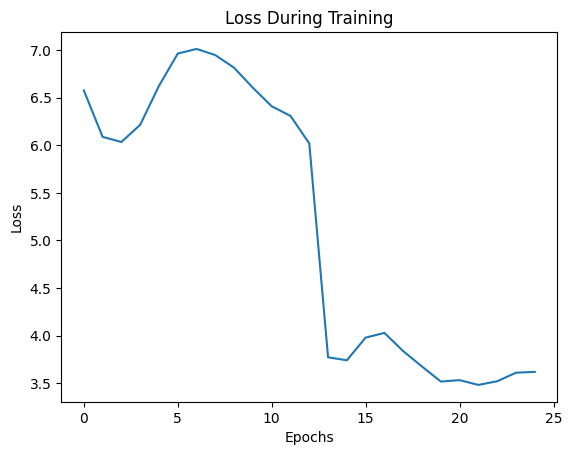

4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 840ms/step


,filename,gt_audio,gt_spectrogram,min_max,pred_spectrogram,cosine_similarity,pred_spectrogram_vqvae
0,jazz.00000.wav,"[-0.009246826, -0.011779785, -0.013702393, -0....","[[0.3865718, 0.47441396, 0.45137018, 0.5116136...","(-80.0, 0.0)","[[0.3900159001350403, 0.46731626987457275, 0.4...",0.990047,"[[[-5.00386995554436e-05], [-0.001283469959162..."
1,jazz.00001.wav,"[0.0024108887, 0.005493164, 0.008666992, 0.011...","[[0.59155864, 0.52710944, 0.5079421, 0.5584143...","(-80.0, 0.0)","[[0.5960085988044739, 0.5953367948532104, 0.61...",0.981288,"[[[-5.003886326448992e-05], [-0.00128346879500..."
2,jazz.00002.wav,"[0.0033569336, 0.00491333, 0.0037841797, 0.004...","[[0.43810177, 0.35986775, 0.27125865, 0.293299...","(-80.0, 0.0)","[[0.3586697578430176, 0.3102199137210846, 0.27...",0.993566,"[[[-5.003807746106759e-05], [-0.00128346972633..."
3,jazz.00003.wav,"[0.029510498, 0.048187256, 0.041900635, 0.0433...","[[0.7292227, 0.6961829, 0.63356054, 0.6362777,...","(-80.0, 0.0)","[[0.6179190874099731, 0.588384747505188, 0.567...",0.986097,"[[[-5.0038055633194745e-05], [-0.0012834696099..."
4,jazz.00004.wav,"[0.122039795, 0.22442627, 0.19665527, 0.171508...","[[0.5783963, 0.49947515, 0.4212994, 0.38037986...","(-80.0, 0.0)","[[0.5548125505447388, 0.5228515863418579, 0.43...",0.985563,"[[[-5.0039241614285856e-05], [-0.0012834683293..."


In [21]:
# # ---- TRAINING PARAMETERS ---- #
# latent_dim = 128  # Controls the size of the compressed latent space. A higher value captures more detail.
# num_embeddings = 32  # Number of unique codebook vectors available for quantization.
# beta = 1
# batch_size = 10
# epochs = 25

# # visualizing the model
# vqvae_model = get_vqvae(latent_dim, num_embeddings, beta)
# vqvae_model.summary()


# # ---- MODEL TRAINING ---- #
# # Compute variance of training data to normalize loss calculations.
# train_variance = tf.math.reduce_variance(jazz_songs)

# # Initialize the VQ-VAE trainer 
# vqvae_trainer = VQVAETrainer(train_variance, latent_dim=latent_dim, num_embeddings=num_embeddings, beta=beta)

# vqvae_trainer.compile(optimizer=keras.optimizers.Adam(learning_rate=0.00005))

# history = vqvae_trainer.fit(jazz_songs, epochs=epochs, batch_size=batch_size)

# # ---- PLOT TRAINING LOSS ---- #
# import matplotlib.pyplot as plt
# plt.plot(history.history['loss'])
# plt.title('Loss During Training')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.show()


# pred_spectrograms_vqvae = vqvae_model.predict(jazz_songs)
# jazz_df['pred_spectrogram_vqvae'] = pd.Series(pred_spectrograms_vqvae.tolist())
# jazz_df.head()

In [22]:
# # ---- EVALUATE RECONSTRUCTION QUALITY ---- #

# # Higher values indicate better reconstructions.
# jazz_df['cosine_similarity_vqvae'] = compute_cosine_similarity(jazz_df, 'gt_spectrogram', 'pred_spectrogram_vqvae')

# sorted_similarities_vqvae = jazz_df['cosine_similarity_vqvae'].sort_values()
# worst_idx_vqvae = jazz_df['cosine_similarity_vqvae'].idxmin()  
# best_idx_vqvae = jazz_df['cosine_similarity_vqvae'].idxmax()   

# print(f"Worst VQ-VAE Reconstruction Index: {worst_idx_vqvae}")
# print(f"Best VQ-VAE Reconstruction Index: {best_idx_vqvae}")

# print(jazz_df['cosine_similarity_vqvae'].describe())  # Expect higher values if reconstruction improves

# # ---- AUDIO COMPARISON ---- #
# def compare_song_audios_vqvae(jazz_df: pd.DataFrame, sample_n: int = 0):
#     """
#     Compare the original and reconstructed audio for a given spectrogram.
#     """
#     pred_audio_vqvae = reconstruct_audio(
#         jazz_df.iloc[sample_n]['pred_spectrogram_vqvae'],
#         22050, 128, jazz_df.iloc[sample_n]['min_max']
#     )
#     original_audio = jazz_df.iloc[sample_n]['gt_audio']

#     return ipd.Audio(original_audio, rate=22050), ipd.Audio(pred_audio_vqvae, rate=22050)

# real_vqvae, pred_vqvae = compare_song_audios_vqvae(jazz_df, best_idx_vqvae)

# print("Best Reconstruction (Original Audio):")
# display(real_vqvae)

# print("Best VQ-VAE Reconstruction:")
# display(pred_vqvae)

# # ---- VISUALIZING SPECTROGRAM RECONSTRUCTIONS ---- #
# def plot_vqvae_spectrogram_comparison(jazz_df: pd.DataFrame, index: int):
#     """
#     Plots the original and VQ-VAE reconstructed spectrogram side by side.
#     """
#     fig, axes = plt.subplots(1, 2, figsize=(10, 5))

#     # Original spectrogram
#     axes[0].imshow(jazz_df.iloc[index]['gt_spectrogram'], origin='lower', aspect='auto')
#     axes[0].set_title("Original Spectrogram")

#     # VQ-VAE reconstructed spectrogram
#     axes[1].imshow(jazz_df.iloc[index]['pred_spectrogram_vqvae'], origin='lower', aspect='auto')
#     axes[1].set_title("VQ-VAE Reconstructed Spectrogram")

#     plt.show()

# # Plot and compare the worst and best reconstructions
# plot_vqvae_spectrogram_comparison(jazz_df, worst_idx_vqvae)
# plot_vqvae_spectrogram_comparison(jazz_df, best_idx_vqvae)

Worst VQ-VAE Reconstruction Index: 85
Best VQ-VAE Reconstruction Index: 96
count    99.000000
mean     -0.218885
std       0.014561
min      -0.245635
25%      -0.230656
50%      -0.220110
75%      -0.210166
max      -0.175724
Name: cosine_similarity_vqvae, dtype: float64


C:\Users\kaminfar\AppData\Local\anaconda3\envs\cs757_project\lib\site-packages\librosa\feature\inverse.py:99: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(
C:\Users\kaminfar\AppData\Local\anaconda3\envs\cs757_project\lib\site-packages\librosa\core\spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=0
  warnings.warn(


ValueError: zero-size array to reduction operation maximum which has no identity

In [ ]:
# # ---- CHECK EMBEDDING CHANGES OVER TRAINING ---- #

# trained_embeddings = quantizer.embeddings.numpy()
# embedding_change = np.abs(trained_embeddings - initial_embeddings)

# print("Initial vs. Trained Embeddings):")
# for i in range(5):
#     print(f"Embedding {i}:")
#     print(f"  Initial: {initial_embeddings[i]}") 
#     print(f"  Trained: {trained_embeddings[i]}") 
#     print(f"  Change:  {embedding_change[i]}")  

# # ---- CHECK HOW WELL EMBEDDINGS ARE UTILIZED ---- #
# z_e = encoder.predict(jazz_songs)

# encoding_indices = np.argmin(
#     np.sum(z_e**2, axis=1, keepdims=True)  
#     - 2 * np.matmul(z_e, trained_embeddings.T)
#     + np.sum(trained_embeddings**2, axis=1),  
#     axis=1
# )

# # Count the number of unique embeddings that were actually used during training
# unique_embeddings_used = len(np.unique(encoding_indices))
# print(f"Unique embeddings used: {unique_embeddings_used} / {num_embeddings}")


# plt.figure()
# plt.hist(encoding_indices, bins=num_embeddings, range=(0, num_embeddings - 1))
# plt.xlabel("Embedding Index")
# plt.ylabel("Usage Count")
# plt.title("Used Embedding Indices")
# plt.show()


# plt.figure()
# plt.hist(z_e.flatten(), bins=100)
# plt.title("Latent Space Activations")
# plt.xlabel("Activation Value")
# plt.ylabel("Frequency")
# plt.show()


The VQ-VAE training was unstable. The VQ loss kept increasing, even when the reconstruction loss improved. Experimenting with different beta values, batch sizes, and learning rates did not help. The main issue was poor embedding updates I think, likely due to batch normalization interfering with quantization or wrong implementation. Even after adjustments, the codebook usage remained low, meaning many embeddings were never assigned.


### So lets try another approach

Due to these challenges, we decided to use Hierarchical VAE (HVAE) instead. 
HVAE keeps the latent space continuous while adding an extra latent layer. This allows it to capture high-level and low-level features separately. HVAE is also easier to train than VQ-VAE since it does not rely on discrete representations. 

# Hierarchical VAE (HVAE) 

In [45]:
def create_hvae():
    """
    Defines a Hierarchical VAE (HVAE) with two latent layers to capture hierarchical representations.
    """
    n_mels, time_frames = 128, TIME_FRAMES
    latent_dim_1 = 64  # Higher-level features
    latent_dim_2 = 32  # Lower-level details

    # ---- ENCODER ---- #
    encoder_input = Input(shape=(n_mels, time_frames))
    encoder_flatten = Flatten()(encoder_input)

    # First latent layer (z1)
    z1_mean = Dense(latent_dim_1, activation="linear")(encoder_flatten)
    z1_log_var = Dense(latent_dim_1, activation="linear")(encoder_flatten)

    def sampling(args):
        mean, log_var = args
        batch = K.shape(mean)[0]
        dim = K.int_shape(mean)[1]
        epsilon = K.random_normal(shape=(batch, dim))
        return mean + K.exp(0.5 * K.clip(log_var, -10, 10)) * epsilon  # Clip to prevent NaNs

    z1 = Lambda(sampling, output_shape=(latent_dim_1,))([z1_mean, z1_log_var])

    # Second latent layer (z2) based on z1
    z2_mean = Dense(latent_dim_2, activation="linear")(z1)
    z2_log_var = Dense(latent_dim_2, activation="linear")(z1)
    z2 = Lambda(sampling, output_shape=(latent_dim_2,))([z2_mean, z2_log_var])

    encoder = Model(encoder_input, [z1_mean, z1_log_var, z2_mean, z2_log_var, z1, z2], name="encoder")

    # ---- DECODER ---- #
    decoder_input = Input(shape=(latent_dim_2,))
    decoder_dense = Dense(n_mels * time_frames, activation="sigmoid")(decoder_input)
    decoder_reshaped = Reshape((n_mels, time_frames))(decoder_dense)
    decoder = Model(decoder_input, decoder_reshaped, name="decoder")

    # ---- LOSS FUNCTION ---- #
    def hvae_loss_function(args):
        """
        Computes the HVAE loss with reconstruction loss and KL divergence.
        """
        y_true, y_pred, z1_mean, z1_log_var, z2_mean, z2_log_var = args

        reconstruction_loss = K.mean(K.square(y_true - y_pred))

        kl_loss_z1 = -0.5 * K.mean(1 + K.clip(z1_log_var, -10, 10) - K.square(z1_mean) - K.exp(K.clip(z1_log_var, -10, 10)))   #(Ensure numerical stability)

        kl_loss_z2 = -0.5 * K.mean(1 + K.clip(z2_log_var, -10, 10) - K.square(z2_mean) - K.exp(K.clip(z2_log_var, -10, 10)))

        return reconstruction_loss + kl_loss_z1 + kl_loss_z2

    # ---- FULL HVAE MODEL ---- #
    hvae_input = Input(shape=(n_mels, time_frames))
    hvae_target = Input(shape=(n_mels, time_frames))

    encoder_output = encoder(hvae_input)
    decoder_output = decoder(encoder_output[5])  # Use z2 for final reconstruction

    # Add loss function to model
    loss = Lambda(hvae_loss_function, output_shape=(1,), name='loss')(
        [hvae_target, decoder_output, encoder_output[0], encoder_output[1], encoder_output[2], encoder_output[3]]
    )
    
    hvae = Model(inputs=[hvae_input, hvae_target], outputs=[decoder_output, loss])
    
    return hvae

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 309ms/step - loss: 0.1045
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 324ms/step - loss: 0.0963
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 298ms/step - loss: 0.0743
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 312ms/step - loss: 0.0645
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 295ms/step - loss: 0.0579
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 307ms/step - loss: 0.0465
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 301ms/step - loss: 0.0431
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 293ms/step - loss: 0.0424
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 302ms/step - loss: 0.0389
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 302ms/step - loss: 0.0351
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 328ms/step - loss: 0.0384
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 319ms/step - loss: 0.0339
Epoch 13/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 319ms/step - loss: 0.0317
Epoch 14/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 323ms/step - loss: 0.0280
Epoch 15/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 

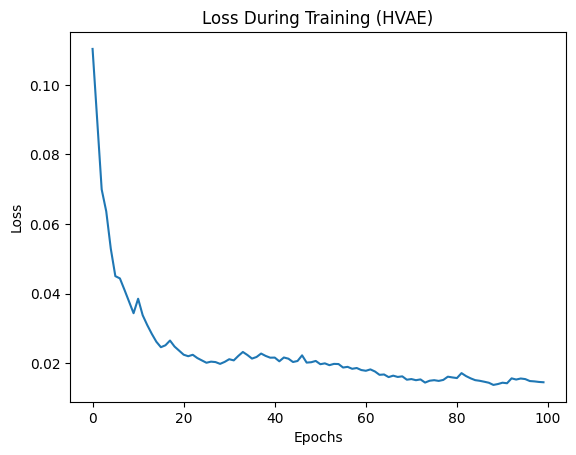

In [46]:
# Prepare dataset
jazz_songs = np.array(jazz_df['gt_spectrogram'].tolist())

# Set hyperparameters
batch_size = 10
epochs = 100

# Compile the HVAE
hvae = create_hvae()
hvae.compile(optimizer=Adam(learning_rate=0.001), loss=['mse', None])

# Train the HVAE
history_hvae = hvae.fit([jazz_songs, jazz_songs], [jazz_songs, np.zeros_like(jazz_songs)],
                        epochs=epochs,
                        batch_size=batch_size)

# Plot training loss
plt.plot(history_hvae.history['loss'])
plt.title('Loss During Training (HVAE)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

## Evaluation of HVAE

In [47]:
pred_spectrograms_hvae, _ = hvae.predict([jazz_songs, jazz_songs])
jazz_df['pred_spectrogram_hvae'] = pd.Series(pred_spectrograms_hvae.tolist())

jazz_df['cosine_similarity_hvae'] = compute_cosine_similarity(jazz_df, 'gt_spectrogram', 'pred_spectrogram_hvae')

# Find best and worst reconstructions for HVAE
worst_idx_hvae = jazz_df['cosine_similarity_hvae'].idxmin()
best_idx_hvae = jazz_df['cosine_similarity_hvae'].idxmax()

print(f"Worst HVAE Reconstruction Index: {worst_idx_hvae}")
print(f"Best HVAE Reconstruction Index: {best_idx_hvae}")

print(jazz_df['cosine_similarity_hvae'].describe())  # Summarize similarity scores


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step 
Worst HVAE Reconstruction Index: 96
Best HVAE Reconstruction Index: 43
count    99.000000
mean      0.963104
std       0.014744
min       0.921866
25%       0.953964
50%       0.963413
75%       0.974633
max       0.992033
Name: cosine_similarity_hvae, dtype: float64


In [48]:
def compare_song_audios_hvae(jazz_df: pd.DataFrame, sample_n: int = 0):
    pred_audio_hvae = reconstruct_audio(
        jazz_df.iloc[sample_n]['pred_spectrogram_hvae'],
        22050, 128, jazz_df.iloc[sample_n]['min_max']
    )
    original_audio = jazz_df.iloc[sample_n]['gt_audio']

    return ipd.Audio(original_audio, rate=22050), ipd.Audio(pred_audio_hvae, rate=22050)

# Listen to the worst and best reconstructions for HVAE
print("Worst:")
real_hvae, pred_hvae = compare_song_audios_hvae(jazz_df, worst_idx_hvae)
display(real_hvae)
display(pred_hvae)

print("Best:")
real_hvae, pred_hvae = compare_song_audios_hvae(jazz_df, best_idx_hvae)
display(real_hvae)
display(pred_hvae)


Worst:


Best:


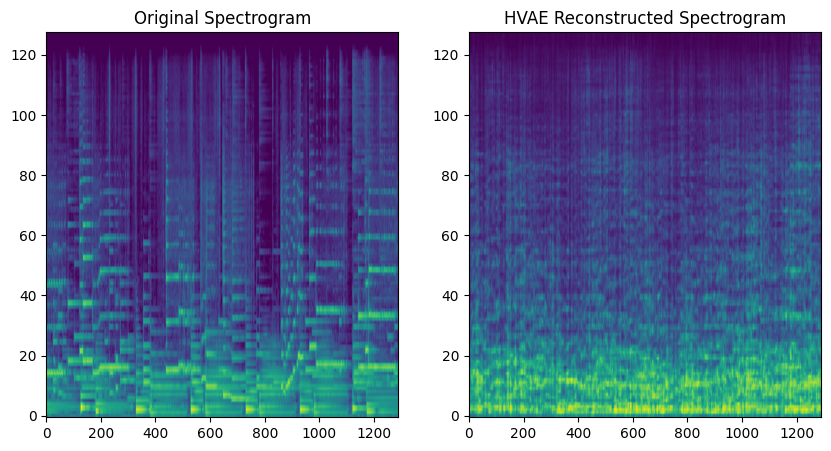

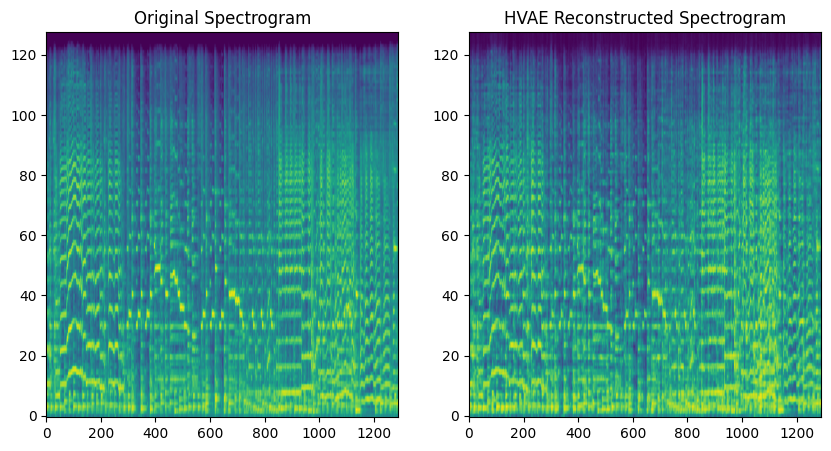

In [49]:
def plot_hvae_spectrogram_comparison(jazz_df: pd.DataFrame, index: int):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(jazz_df.iloc[index]['gt_spectrogram'], origin='lower', aspect='auto')
    axes[0].set_title("Original Spectrogram")

    # HVAE  
    axes[1].imshow(jazz_df.iloc[index]['pred_spectrogram_hvae'], origin='lower', aspect='auto')
    axes[1].set_title("HVAE Reconstructed Spectrogram")

    plt.show()

plot_hvae_spectrogram_comparison(jazz_df, worst_idx_hvae)
plot_hvae_spectrogram_comparison(jazz_df, best_idx_hvae)


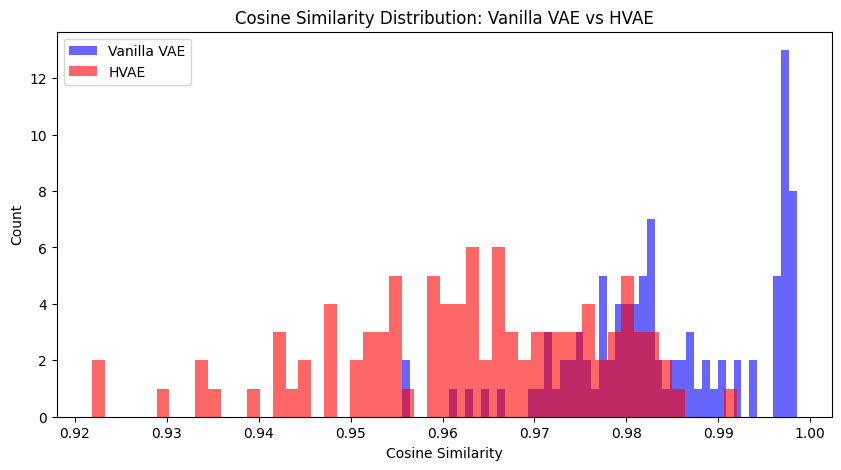

In [50]:
plt.figure(figsize=(10, 5))

plt.hist(jazz_df['cosine_similarity'], bins=50, alpha=0.6, label="Vanilla VAE", color="blue")
plt.hist(jazz_df['cosine_similarity_hvae'], bins=50, alpha=0.6, label="HVAE", color="red")

plt.xlabel("Cosine Similarity")
plt.ylabel("Count")
plt.title("Cosine Similarity Distribution: Vanilla VAE vs HVAE")
plt.legend()
plt.show()


In [51]:
print(f"Vanilla VAE Best Similarity: {jazz_df['cosine_similarity'].max():.4f}")
print(f"HVAE Best Similarity: {jazz_df['cosine_similarity_hvae'].max():.4f}")

print(f"Vanilla VAE Worst Similarity: {jazz_df['cosine_similarity'].min():.4f}")
print(f"HVAE Worst Similarity: {jazz_df['cosine_similarity_hvae'].min():.4f}")


Vanilla VAE Best Similarity: 0.9985
HVAE Best Similarity: 0.9920
Vanilla VAE Worst Similarity: 0.9556
HVAE Worst Similarity: 0.9219
